# Without Predator

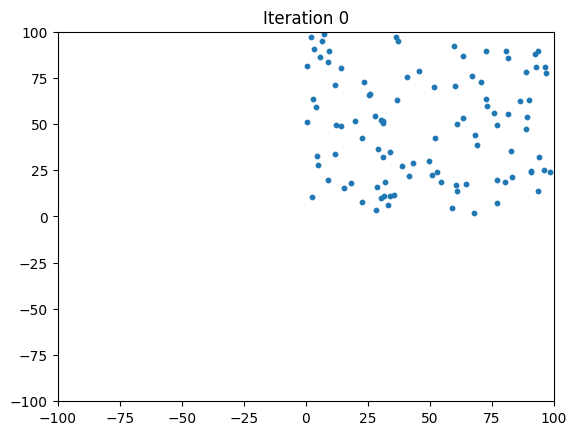

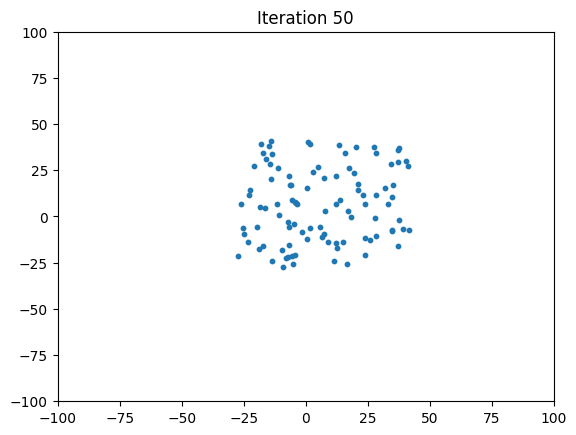

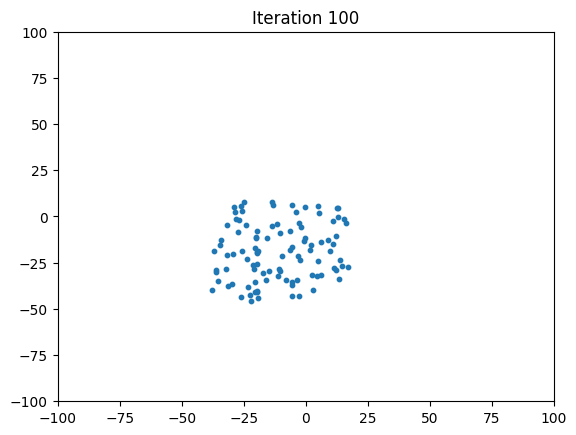

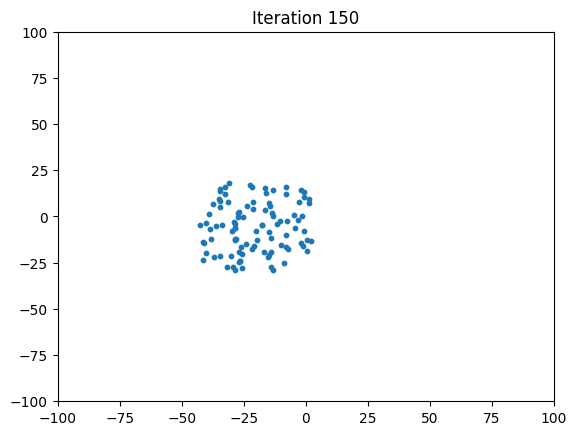

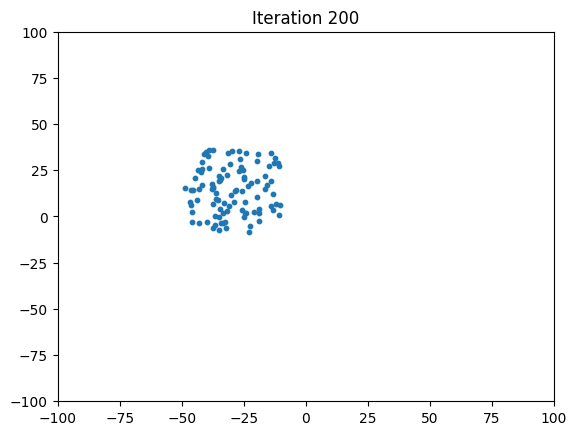

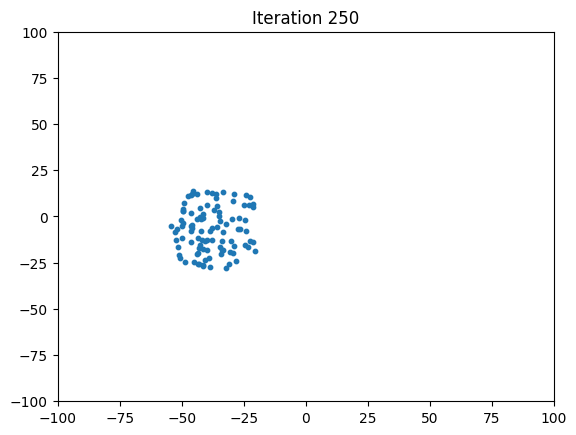

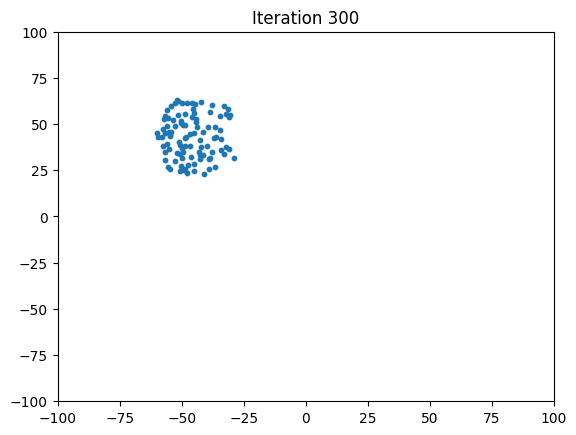

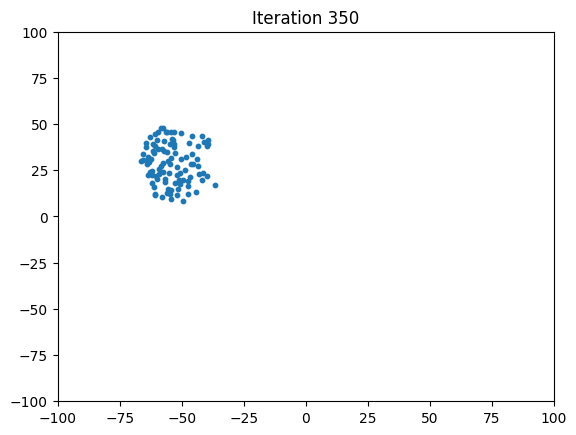

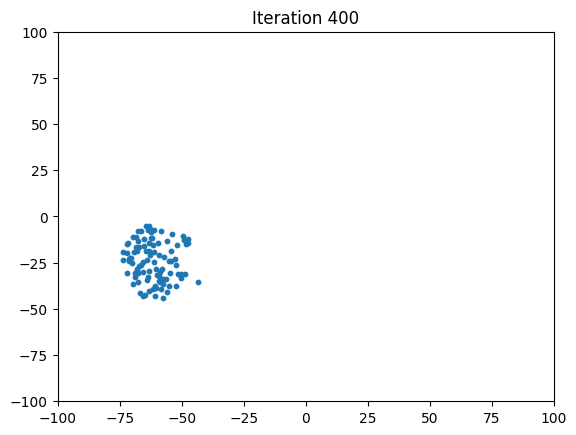

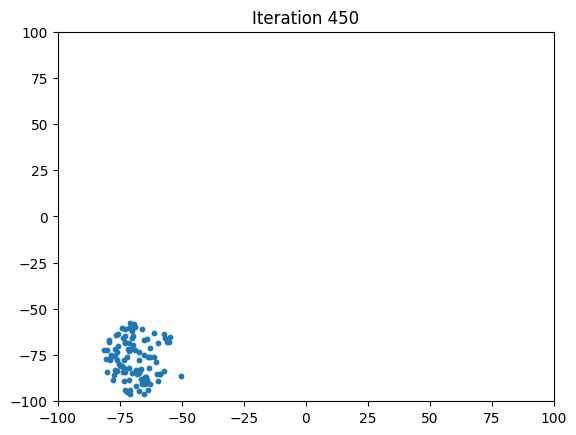

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
K_r = 1.0  # Repulsion constant
K_a = 1.0  # Alignment constant
K_f = 0.1  # Friction constant
K_h = 1.0  # Homing constant
alpha = 200
beta = 0.1
s = 10  # Target speed
delta_t = 0.02  # Time step
rr = 10  # Repulsion radius
ra = 20  # Alignment radius

# Parameters
num_agents = 100
dimensions = 2  # 2D space
home_location = np.array([0, 0])

# Initialize positions and velocities
np.random.seed(42)  # For reproducibility
positions = np.random.rand(num_agents, dimensions) * 100  # Random positions in a 100x100 area
velocities = np.random.randn(num_agents, dimensions)  # Random initial velocities

# Helper function to compute the Euclidean distance
def euclidean_distance(x, y):
    return np.linalg.norm(x - y)

# Helper function for the sigmoidal force wrap
def sigmoidal_force(F):
    return alpha * np.tanh(beta * F)

# Main loop to update positions and velocities
def update_positions_and_velocities(positions, velocities):
    for i in range(num_agents):
        # Forces
        F_r = np.zeros(dimensions)  # Repulsion force
        F_a = np.zeros(dimensions)  # Alignment force
        F_h = home_location - positions[i]  # Homing force
        F_f = -velocities[i] * (np.linalg.norm(velocities[i]) - s) / s  # Friction force

        # Calculate Repulsion Force (F_r)
        for j in range(num_agents):
            if i != j and euclidean_distance(positions[i], positions[j]) < rr:
                F_r += (positions[i] - positions[j]) / (euclidean_distance(positions[i], positions[j]) ** 2)

        # Calculate Alignment Force (F_a)
        for j in range(num_agents):
            if i != j and euclidean_distance(positions[i], positions[j]) < ra:
                F_a += velocities[j] - velocities[i]

        # Total Force
        F_total = K_a * F_a + K_r * F_r + K_f * F_f + K_h * F_h
        F_total = sigmoidal_force(F_total)

        # Update velocity and position using Euler method
        velocities[i] += F_total * delta_t
        positions[i] += velocities[i] * delta_t

    return positions, velocities

# Run the simulation for a number of iterations
num_iterations = 500
for iteration in range(num_iterations):
    positions, velocities = update_positions_and_velocities(positions, velocities)

    # Plot the positions of the agents
    if iteration % 50 == 0:  # Plot every 50 iterations
        plt.clf()
        plt.scatter(positions[:, 0], positions[:, 1], s=10)
        plt.xlim(-100, 100)
        plt.ylim(-100, 100)
        plt.title(f"Iteration {iteration}")
        plt.pause(0.001)

plt.show()

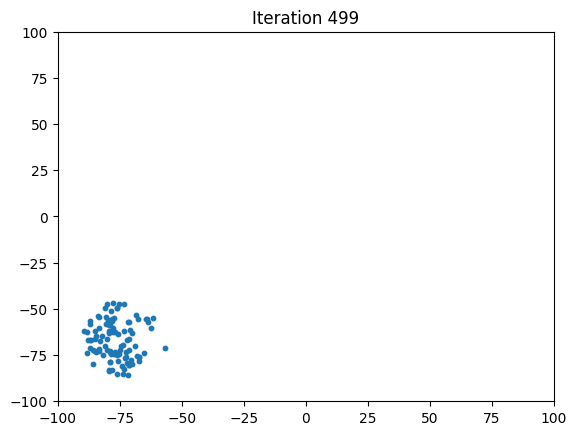

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Constants
K_r = 1.0  # Repulsion constant
K_a = 1.0  # Alignment constant
K_f = 0.1  # Friction constant
K_h = 1.0  # Homing constant
alpha = 200
beta = 0.1
s = 10  # Target speed
delta_t = 0.02  # Time step
rr = 10  # Repulsion radius
ra = 20  # Alignment radius

# Parameters
num_agents = 100
dimensions = 2  # 2D space
home_location = np.array([0, 0])

# Initialize positions and velocities
np.random.seed(42)  # For reproducibility
positions = np.random.rand(num_agents, dimensions) * 100  # Random positions in a 100x100 area
velocities = np.random.randn(num_agents, dimensions)  # Random initial velocities

# Helper function to compute the Euclidean distance
def euclidean_distance(x, y):
    return np.linalg.norm(x - y)

# Helper function for the sigmoidal force wrap
def sigmoidal_force(F):
    return alpha * np.tanh(beta * F)

# Main loop to update positions and velocities
def update_positions_and_velocities(positions, velocities):
    for i in range(num_agents):
        # Forces
        F_r = np.zeros(dimensions)  # Repulsion force
        F_a = np.zeros(dimensions)  # Alignment force
        F_h = home_location - positions[i]  # Homing force
        F_f = -velocities[i] * (np.linalg.norm(velocities[i]) - s) / s  # Friction force

        # Calculate Repulsion Force (F_r)
        for j in range(num_agents):
            if i != j and euclidean_distance(positions[i], positions[j]) < rr:
                F_r += (positions[i] - positions[j]) / (euclidean_distance(positions[i], positions[j]) ** 2)

        # Calculate Alignment Force (F_a)
        for j in range(num_agents):
            if i != j and euclidean_distance(positions[i], positions[j]) < ra:
                F_a += velocities[j] - velocities[i]

        # Total Force
        F_total = K_a * F_a + K_r * F_r + K_f * F_f + K_h * F_h
        F_total = sigmoidal_force(F_total)

        # Update velocity and position using Euler method
        velocities[i] += F_total * delta_t
        positions[i] += velocities[i] * delta_t

    return positions, velocities

# Create the figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-100, 100)
ax.set_ylim(-100, 100)
scatter = ax.scatter(positions[:, 0], positions[:, 1], s=10)

# Update function for FuncAnimation
def update(frame):
    global positions, velocities
    positions, velocities = update_positions_and_velocities(positions, velocities)
    scatter.set_offsets(positions)
    ax.set_title(f"Iteration {frame}")
    return scatter,

# Create the animation
ani = FuncAnimation(fig, update, frames=range(0, 500, 1), interval=50, blit=True)

ani.save('agents_simulation.mp4', writer='ffmpeg', fps=20)

# Show the animation
plt.show()

In [ ]:
from IPython.display import HTML
HTML(ani.to_jshtml())

# With Predator

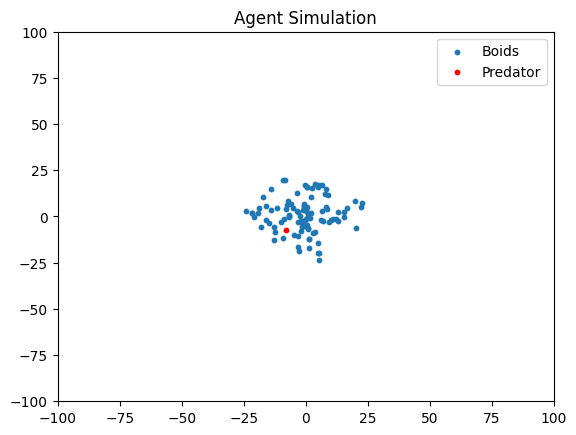

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Constants for forces
K_r = 1.0  # Repulsion constant
K_a = 0.1  # Alignment constant
K_f = 20.0  # Friction constant
K_h = 2.0  # Homing constant
K_p = 200.0  # Predator force constant
alpha = 200
beta = 0.1
s = 10  # Target speed
delta_t = 0.02  # Time step
rr = 1  # Repulsion radius
ra = 1  # Alignment radius
rp = 5  # Predator interaction radius

# Parameters
num_agents = 100
dimensions = 2  # 2D space
home_location = np.array([0, 0])

# Initialize positions and velocities
np.random.seed(42)  # For reproducibility
positions = np.random.rand(num_agents, dimensions) * 100  # Random positions in a 100x100 area
velocities = np.random.randn(num_agents, dimensions)  # Random initial velocities

# Predator initialization (Lorenz system)
sigma = 10
rho = 28
beta = 8 / 3
predator_position = np.array([0, 0])
predator_velocity = np.array([1, 1])
lorenz_state = np.array([1.0, 1.0, 1.0])  # Initial state for Lorenz system

# Helper function to compute the Euclidean distance
def euclidean_distance(x, y):
    return np.linalg.norm(x - y)

# Helper function for the sigmoidal force wrap
def sigmoidal_force(F):
    return alpha * np.tanh(beta * F)

def rescale_position(position, mean_target=0, std_target=2):
    position_mean = np.mean(position)
    position_std = np.std(position)

    # Check if the standard deviation is zero
    if position_std == 0:
        return position - position_mean  # or return position - position_mean if you want to center it without scaling

    # Rescale the position
    rescaled_position = (position - position_mean) / position_std * std_target + mean_target
    return rescaled_position

# Lorenz system for predator's chaotic motion
def lorenz_update(state, sigma, rho, beta, delta_t):
    x1, y1, z1 = state
    x,y,z = x1,y1,z1
    dx = sigma * (y - x)
    dy = x * (rho - z) - y
    dz = x * y - beta * z
    state_updated = np.array([x + dx * delta_t, y + dy * delta_t, z + dz * delta_t])
    return state_updated


# Predator influence force
def predator_force(agent_position, predator_position, rp):
    distance = np.linalg.norm(agent_position - predator_position) #Euclidean norm
    if distance < rp:
      return (agent_position - predator_position) / (distance**2)
    else:
      return np.zeros(2)


# Heaviside function
def H(x):
    return 1 if x > 0 else 0

# Main loop to update positions and velocities
def update_positions_and_velocities(positions, velocities, predator_position):
    for i in range(num_agents):
        # Forces
        F_r = np.zeros(dimensions)  # Repulsion force
        F_a = np.zeros(dimensions)  # Alignment force
        F_h = home_location - positions[i]  # Homing force
        F_f = -velocities[i] * (np.linalg.norm(velocities[i]) - s) / s  # Friction force
        F_p = predator_force(positions[i], predator_position, rp)  # Predator force

        # Calculate Repulsion Force (F_r)
        for j in range(num_agents):
            if i != j and euclidean_distance(positions[i], positions[j]) < rr:
                F_r += (positions[i] - positions[j]) / (euclidean_distance(positions[i], positions[j]) ** 2)

        for j in range(num_agents):
            if i != j and euclidean_distance(positions[i], positions[j]) < ra:
                F_a += velocities[j] - velocities[i]

        F_total = K_a * F_a + K_r * F_r + K_f * F_f + K_h * F_h + K_p * F_p
        F_total = sigmoidal_force(F_total)

        velocities[i] += F_total * delta_t
        positions[i] += velocities[i] * delta_t

    return positions, velocities

fig, ax = plt.subplots()
scatter_agents = ax.scatter(positions[:, 0], positions[:, 1], s=10, label="Boids")
scatter_predator = ax.scatter(predator_position[0], predator_position[1], color='red', s=10, label="Predator")
ax.set_xlim(-100, 100)
ax.set_ylim(-100, 100)
ax.set_title("Agent Simulation")
ax.legend()

def update(frame):
    global positions, velocities, predator_position, lorenz_state

    lorenz_state = lorenz_update(lorenz_state, sigma, rho, beta, delta_t*0.2)
    predator_position = np.array([lorenz_state[0], lorenz_state[1]])

    positions, velocities = update_positions_and_velocities(positions, velocities, predator_position)

    scatter_agents.set_offsets(positions)
    scatter_predator.set_offsets([predator_position])

    return scatter_agents, scatter_predator

ani = FuncAnimation(fig, update, frames=range(500), interval=50, blit=True)
ani.save('agents_simulation_with_lorenzpredator.mp4', writer='ffmpeg', fps=50)

plt.show()